<a href="https://colab.research.google.com/github/HelenMargfoy/parcial1_IA/blob/main/Main.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# 🏠 Predicción de categoría de precios de casas mediante el uso de Algoritmos de Aprendizaje Automático Clásico


# 🛠️ Instalaciones Necesarias

Antes de comenzar, necesitamos instalar algunas librerías específicas para nuestro análisis. A continuación se listan las librerías y su propósito:

### Manejo de Datos y Cálculos
- **pandas**: Manipulación y análisis de datos tabulares. Esencial para trabajar con DataFrames y Series, permitiendo operaciones como filtrado, agrupación y transformación de datos
- **numpy**: Operaciones numéricas y matrices multidimensionales. Base fundamental para cálculos científicos y operaciones vectorizadas
- **scipy**: Funciones científicas y estadísticas avanzadas, incluyendo optimización, álgebra lineal y procesamiento de señales

### Hugging Face
- **huggingface_hub**: Acceso a modelos y datasets de Hugging Face. Permite descargar y utilizar modelos pre-entrenados y datasets de la comunidad
- **datasets**: Manejo eficiente de datasets de Hugging Face. Optimizado para grandes conjuntos de datos con funciones de carga streaming

### Visualización
- **matplotlib**: Biblioteca base para crear gráficos estáticos, desde simples gráficos de líneas hasta visualizaciones complejas personalizables
- **seaborn**: Construida sobre matplotlib, ofrece una interfaz de alto nivel para visualizaciones estadísticas con temas y paletas predefinidas
- **plotly**: Creación de gráficos interactivos para web, permitiendo zoom, hover y selección de datos
- **yellowbrick**: Visualizadores específicos para machine learning, incluyendo matrices de confusión, curvas ROC y visualizaciones de validación

### Machine Learning
- **scikit-learn**: Framework completo de machine learning que incluye algoritmos de clasificación, regresión, clustering y herramientas de preprocesamiento
- **imbalanced-learn**: Especializada en el manejo de datasets desbalanceados, proporcionando técnicas como SMOTE y diversos métodos de sampling

### Utilidades
- **tqdm**: Barras de progreso para monitorear el avance de procesos largos, compatible con bucles y operaciones iterativas
- **joblib**: Herramienta para paralelización de procesos y caching de resultados computacionales pesados
- **fsspec**: Sistema de archivos abstracto necesario para la compatibilidad con diferentes sistemas de almacenamiento

Ejecutemos la celda de código siguiente para instalar todas las librerías necesarias. La flag -q asegura una instalación silenciosa para mantener limpia la salida:

In [22]:
# Instalación silenciosa de librerías
!pip install -q pandas
!pip install -q numpy
!pip install -q scipy
!pip install -q matplotlib
!pip install -q seaborn
!pip install -q plotly
!pip install -q yellowbrick
!pip install -q scikit-learn
!pip install -q imbalanced-learn
!pip install -q tqdm
!pip install -q joblib
!pip install -q huggingface_hub
!pip install -q datasets
!pip install -q fsspec==2024.10.0
!pip install kaggle ydata_profiling -q

# 📊 Base de Datos: USA House Price

Para este ejercicio usaremos la base de datos "USA House Price" disponible en [Hugging Face](https://huggingface.co/datasets/Nhule0502/USA_house_price).

## 📝 Descripción
Esta base de datos contiene información sobre casas vendidas en distintas ciudades de Estados Unidos.

## 🔍 Variables Disponibles
A continuación se describen las 18 variables del conjunto de datos utilizado en este proyecto:

1. **date**: Fecha de venta de la casa (tipo de dato: cadena de texto).
2. **price**: Precio de la casa (tipo de dato: flotante).
3. **bedrooms**: Número de dormitorios de la casa (tipo de dato: entero).
4. **bathrooms**: Número de baños de la casa (tipo de dato: flotante).
5. **sqft_living**: Metros cuadrados de área habitable (tipo de dato: entero).
6. **sqft_lot**: Tamaño del lote en metros cuadrados (tipo de dato: entero).
7. **floors**: Número de pisos de la casa (tipo de dato: flotante).
8. **waterfront**: Si la casa tiene vista al mar (1 = sí, 0 = no; tipo de dato: entero).
9. **view**: Calificación de la vista (valor entero entre 0 y 4).
10. **condition**: Condición general de la casa (valor entero entre 1 y 5).
11. **sqft_above**: Área habitable sobre el nivel del suelo (tipo de dato: entero).
12. **sqft_basement**: Área del sótano (tipo de dato: entero).
13. **yr_built**: Año de construcción de la casa (tipo de dato: entero).
14. **yr_renovated**: Año de renovación de la casa (tipo de dato: entero).
15. **street**: Dirección de la calle (tipo de dato: texto).
16. **city**: Ciudad donde se encuentra la casa (tipo de dato: texto).
17. **statezip**: Código postal y estado (tipo de dato: texto).
18. **country**: País donde se encuentra la casa (valor fijo "USA"; tipo de dato: texto).

## 🎯 Objetivo
Utilizaremos esta base de datos para:
1. Predecir la probabilidad de que la casa tenga un precio alto o bajo utilizando la variable **price_category**, la cual creamos con este fin
2. Identificar los factores más importantes que influyen en que las casas tengan un precio alto o bajo
3. Evaluar diferentes técnicas de regularización para mejorar nuestras predicciones
4. Analizar métricas de evaluación para modelos de clasificación

## 💡 Consideraciones
- Los datos incluyen tanto variables numéricas como categóricas
- Si bien la base de datos contiene una variable de tiempo, decidimos ignorar esta dimensión de temporalidad provisionalmente
- Es un problema de clasificación binaria (precio alto sí/no)

## Llamada de la base de datos

Por medio de la función streaming, vamos a tomar los 4140 datos disponibles de la base de datos de HuggingFace. Posteriormente, vamos a estudiar los datos y su naturaleza.

In [23]:
# Importamos las librerías necesarias
import pandas as pd
from datasets import load_dataset
import numpy as np
import seaborn as sns
import matplotlib.pyplot as plt
from ydata_profiling import ProfileReport

# Cargamos el dataset y lo mezclamos
dataset = load_dataset("Nhule0502/USA_house_price")
# Lo que está en rojo es lo que cambiamos, el nombre del dataset
df = pd.DataFrame(list(dataset['train'].shuffle(seed=42).take(4140)))

# Eliminamos la columna "date" porque vamos a omitir la temporalidad y demás variables tipo "object"
df = df.drop(['date', 'city', 'statezip', 'country', 'street'], axis=1)

# Crear una variable dummy que indique si la casa tiene un precio alto (1) o bajo (0)
df['price_category'] = (df['price'] > df['price'].mean()).astype(int)



In [24]:
# Análisis descriptivo de los datos de entrenamiento
reporte = ProfileReport(df, title="Profiling Report")
reporte.to_file("report.html")
reporte

Summarize dataset:   0%|          | 0/5 [00:00<?, ?it/s]

Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

/usr/local/lib/python3.11/dist-packages/ydata_profiling/visualisation/utils.py:73: UserWarning: Tight layout not applied. The bottom and top margins cannot be made large enough to accommodate all Axes decorations.
  plt.savefig(
/usr/local/lib/python3.11/dist-packages/ydata_profiling/visualisation/utils.py:73: UserWarning: Tight layout not applied. The bottom and top margins cannot be made large enough to accommodate all Axes decorations.
  plt.savefig(


Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]

Export report to file:   0%|          | 0/1 [00:00<?, ?it/s]

## 🛠️ PREPROCESAMIENTO DE DATOS

El preprocesamiento de datos es una fase fundamental en el desarrollo de modelos de machine learning. Esta etapa determina en gran medida la calidad y fiabilidad de nuestras predicciones, ya que transforma los datos crudos en un formato adecuado para el entrenamiento de modelos.

En esta sección desarrollaremos cuatro procesos esenciales:

* **Análisis estadístico descriptivo**: Examinaremos las distribuciones, tendencias centrales y dispersión de nuestras variables
* **Análisis de balance de clases**: Evaluaremos la proporción entre las clases de nuestra variable objetivo
* **Estandarización**: Transformaremos nuestras variables numéricas para que estén en escalas comparables
* **Codificación de variables categóricas**: Convertiremos las variables categóricas en formato numérico

Cada uno de estos pasos es crítico para garantizar que nuestros modelos puedan procesar los datos correctamente y generar predicciones confiables.


=== Información del DataFrame ===
<class 'pandas.core.frame.DataFrame'>
RangeIndex: 4140 entries, 0 to 4139
Data columns (total 14 columns):
 #   Column          Non-Null Count  Dtype  
---  ------          --------------  -----  
 0   price           4140 non-null   float64
 1   bedrooms        4140 non-null   float64
 2   bathrooms       4140 non-null   float64
 3   sqft_living     4140 non-null   int64  
 4   sqft_lot        4140 non-null   int64  
 5   floors          4140 non-null   float64
 6   waterfront      4140 non-null   int64  
 7   view            4140 non-null   int64  
 8   condition       4140 non-null   int64  
 9   sqft_above      4140 non-null   int64  
 10  sqft_basement   4140 non-null   int64  
 11  yr_built        4140 non-null   int64  
 12  yr_renovated    4140 non-null   int64  
 13  price_category  4140 non-null   int64  
dtypes: float64(4), int64(10)
memory usage: 452.9 KB
None

=== Valores únicos por columna ===

price:
Tipo de dato: float64
Valores únicos

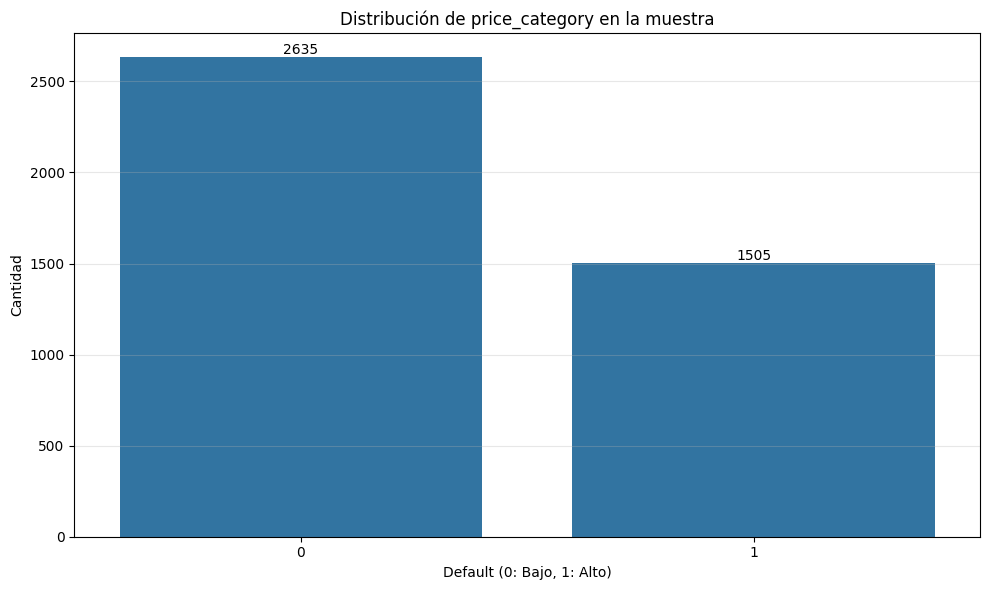

In [25]:
# 1. Examinamos la información básica del DataFrame
print("\n=== Información del DataFrame ===")
print(df.info())

# 2. Verificamos los tipos de datos y valores únicos para cada columna
print("\n=== Valores únicos por columna ===")
for column in df.columns:
    print(f"\n{column}:")
    print(f"Tipo de dato: {df[column].dtype}")
    print(f"Valores únicos: {df[column].nunique()}")
    print(f"Primeros valores únicos: {sorted(df[column].unique())[:5]}")

# 3. Verificamos valores nulos
print("\n=== Valores nulos ===")
print(df.isnull().sum())

# 4. Estadísticas descriptivas básicas
print("\n=== Estadísticas descriptivas ===")
print(df.describe())

# 5. Debalance de clases

print("📊 Distribución de la variable objetivo (price_category):")
class_dist = df['price_category'].value_counts(normalize=True)
print("\nPorcentajes:")
for clase, porcentaje in class_dist.items():
    print(f"Clase {clase}: {porcentaje*100:.2f}%")

# Visualizamos la distribución con un gráfico de barras
import matplotlib.pyplot as plt
import seaborn as sns

plt.figure(figsize=(10, 6))
sns.countplot(data=df, x='price_category')
plt.title('Distribución de price_category en la muestra')
plt.xlabel('Default (0: Bajo, 1: Alto)')
plt.ylabel('Cantidad')

# Añadimos los valores exactos sobre cada barra
for i in plt.gca().containers[0]:
    plt.text(i.get_x() + i.get_width()/2,
            i.get_height(),
            f'{int(i.get_height())}',
            ha='center', va='bottom')

plt.show()

In [26]:
# Funciones de Preprocesamiento de datos

import pandas as pd
import numpy as np
from sklearn.preprocessing import StandardScaler, LabelEncoder

def categorize_features(df):
    """
    Separa las características en numéricas y categóricas.
    """
    # Variables numéricas (montos y edad)
    numeric_features = [
        'bedrooms', 'bathrooms', 'sqft_living', 'sqft_lot',
        'floors', 'sqft_above', 'sqft_basement', 'yr_built', 'yr_renovated'
    ]

    # Variables categóricas
    categorical_features = [
        'waterfront', 'view', 'condition', 'price_category'
    ]

    return numeric_features, categorical_features

def clean_categorical_data(df):
    """
    Limpia los datos categóricos eliminando valores nulos y asegurando que sean tipo string.
    """
    categorical_features = ['waterfront', 'view', 'condition', 'price_category']

    for col in categorical_features:
        df[col] = df[col].fillna('Unknown')  # Reemplazar nulos por "Unknown"
        df[col] = df[col].astype(str)  # Convertir a string si no lo son

    return df

def preprocess_data(df):
    """
    Realiza el preprocesamiento completo de los datos.
    """
    # 1. Separar features
    numeric_features, categorical_features = categorize_features(df)

    # 2. Limpiar datos categóricos
    df = clean_categorical_data(df)
    df.drop('price', axis=1, inplace=True) # Se hace para coregir problemas de multicolinealidad

    # 3. Codificar variables categóricas
    label_encoders = {}
    for feature in categorical_features:
        label_encoders[feature] = LabelEncoder()
        df[feature] = label_encoders[feature].fit_transform(df[feature].astype(str))

    # 4. Separar features y target
    X = df.drop(['price_category'], axis=1)
    y = df['price_category']

    # 5. Guardar información del preprocesamiento
    preprocessing_info = {
        'numeric_features': numeric_features,
        'categorical_features': categorical_features,
        #'scaler': scaler,
        'label_encoders': label_encoders
    }

    return X, y, preprocessing_info

def print_preprocessing_summary(X, y):
    """
    Imprime un resumen del preprocesamiento.
    """
    print("\n=== Resumen del Preprocesamiento ===")
    print(f"Dimensiones de X: {X.shape}")

    print("\nDistribución de clases:")
    print(pd.Series(y).value_counts(normalize=True).round(3))

    print("\nEstadísticas de algunas variables numéricas:")
    print(X.describe().round(2).head())

In [27]:
# Ejecutar el Preprocesamiento
df_copy = df.copy()
# 1. Aplicar preprocesamiento
X, y, preprocessing_info = preprocess_data(df_copy)

# 2. Imprimir resumen
print_preprocessing_summary(X, y)

# 3. Verificar las características procesadas
print("\n=== Características procesadas ===")
print("\nCaracterísticas numéricas:")
print(preprocessing_info['numeric_features'])
print("\nCaracterísticas categóricas:")
print(preprocessing_info['categorical_features'])

# 4. Mostrar información adicional sobre los datos procesados
print("\n=== Información adicional ===")
print(f"Número total de características: {X.shape[1]}")
print(f"Número total de observaciones: {X.shape[0]}")
print("\nPrimeras columnas del dataset procesado:")
display(X.head())


=== Resumen del Preprocesamiento ===
Dimensiones de X: (4140, 12)

Distribución de clases:
price_category
0    0.636
1    0.364
Name: proportion, dtype: float64

Estadísticas de algunas variables numéricas:
       bedrooms  bathrooms  sqft_living  sqft_lot   floors  waterfront  \
count    4140.0    4140.00      4140.00   4140.00  4140.00     4140.00   
mean        3.4       2.16      2143.64  14697.64     1.51        0.01   
std         0.9       0.78       957.48  35876.84     0.53        0.09   
min         0.0       0.00       370.00    638.00     1.00        0.00   
25%         3.0       1.75      1470.00   5000.00     1.00        0.00   

          view  condition  sqft_above  sqft_basement  yr_built  yr_renovated  
count  4140.00    4140.00     4140.00        4140.00   4140.00       4140.00  
mean      0.25       2.45     1831.35         312.29   1970.81        808.37  
std       0.79       0.68      861.38         464.35     29.81        979.38  
min       0.00       0.00      

,bedrooms,bathrooms,sqft_living,sqft_lot,floors,waterfront,view,condition,sqft_above,sqft_basement,yr_built,yr_renovated
0,2.0,1.00,880,7683,1.0,0,0,2,880,0,1942,1999
1,4.0,2.50,2540,38677,2.0,0,0,2,2540,0,1987,2000
2,4.0,2.50,2050,6360,2.0,0,0,2,2050,0,1988,2000
3,5.0,1.75,1250,10530,1.0,0,0,3,1250,0,1966,0
4,4.0,2.25,3190,11597,2.0,0,0,2,2300,890,1984,0


# 🎯 ENTRENAMIENTO DE MODELOS DE CLASIFICACIÓN

El entrenamiento de modelos es una fase crítica en el desarrollo de sistemas de machine learning para la predicción de variables. Esta etapa determina la capacidad de nuestros modelos para aprender patrones.

En esta sección desarrollaremos dos procesos fundamentales:**Preparación para el entrenamiento** y **Proceso de entrenamiento**

Cada uno de estos pasos es esencial para desarrollar un sistema robusto de predicción que pueda identificar efectivamente casos en los que las casas tienen precio alto o bajo.

## Preparación para el entrenamiento

Estableceremos el entorno controlado para nuestros experimentos mediante:
  - Fijación de la semilla aleatoria para garantizar reproducibilidad
  - División estratificada de datos en conjuntos de entrenamiento (80%) y prueba (20%)
  - Selección de modelos de regresión logística con diferentes enfoques de regularización



In [28]:

# --- PREPARACIÓN PARA EL ENTRENAMIENTO ---

# Importamos las bibliotecas necesarias
from sklearn.model_selection import train_test_split
from sklearn.linear_model import LogisticRegression
from imblearn.over_sampling import SMOTE
import numpy as np
import pandas as pd

# Fijamos la semilla aleatoria para garantizar reproducibilidad de resultados
RANDOM_STATE = 42
np.random.seed(RANDOM_STATE)

# Definir matriz de características (X) y vector objetivo (y)
X = df_copy.drop(columns=['price_category'])  # Eliminamos la variable objetivo

y = df_copy['price_category']

# Verificamos la distribución de clases antes de dividir los datos
print("Distribución original de clases:")
print(y.value_counts())

# Si alguna clase tiene menos de 2 observaciones, eliminamos filas atípicas
if y.value_counts().min() < 2:
    df_copy = df_copy.groupby('price_category').filter(lambda x: len(x) > 1)
    X = df_copy.drop(columns=['price_category'])
    y = (df_copy['price_category'] == 'alto').astype(int)

# División de datos (80% entrenamiento, 20% prueba) sin estratificación si es necesario
try:
    X_train, X_test, y_train, y_test = train_test_split(
        X, y, test_size=0.2, random_state=RANDOM_STATE, stratify=y
    )
except ValueError:
    print("⚠️ Advertencia: No se pudo estratificar. Usando división aleatoria simple.")
    X_train, X_test, y_train, y_test = train_test_split(
        X, y, test_size=0.2, random_state=RANDOM_STATE
    )

    # . Separar features
numeric_features, categorical_features = categorize_features(df)

    #Estandarización
scaler = StandardScaler()
X_train[numeric_features] = scaler.fit_transform(X_train[numeric_features])
X_test[numeric_features] = scaler.fit_transform(X_test[numeric_features])

display(X_train)
display(X_test)

# Aplicar SMOTE para balancear las clases en el conjunto de entrenamiento
smote = SMOTE(random_state=RANDOM_STATE)
X_train_balanced, y_train_balanced = smote.fit_resample(X_train, y_train)

# Definición de los modelos a entrenar
models = {
    "Logit Básico": LogisticRegression(random_state=RANDOM_STATE, penalty=None),
    "Logit Ridge": LogisticRegression(penalty='l2', C=1.0, random_state=RANDOM_STATE),
    "Logit Lasso": LogisticRegression(
        penalty='l1', solver='liblinear', C=1.0, random_state=RANDOM_STATE
    )
}

# Diccionarios para almacenar resultados del entrenamiento
predictions = {}      # Predicciones binarias (0/1)
probabilities = {}    # Probabilidades [0,1]

# Imprimimos información sobre la división de datos
print("\n=== Información de la División de Datos ===")
print(f"Dimensiones de X_train: {X_train_balanced.shape}")
print(f"Dimensiones de X_test: {X_test.shape}")
print("\nDistribución de clases después de SMOTE:")
print(pd.Series(y_train_balanced).value_counts(normalize=True).round(3))

# Identificar columnas de tipo object en X_train
object_columns = X_train.select_dtypes(include=['object']).columns
print("Columnas de tipo object en X_train:", object_columns.tolist())


Distribución original de clases:
price_category
0    2635
1    1505
Name: count, dtype: int64


,bedrooms,bathrooms,sqft_living,sqft_lot,floors,waterfront,view,condition,sqft_above,sqft_basement,yr_built,yr_renovated
3189,0.669167,0.429625,-0.166651,0.498165,-0.963169,0,0,2,-0.311531,0.230138,-0.301499,1.233200
60,-1.536087,0.429625,-0.931145,-0.370309,2.776593,0,0,2,-0.669263,-0.673926,1.142729,-0.816524
1153,0.669167,0.429625,0.209260,-0.215117,0.906712,0,0,2,0.601625,-0.673926,1.008382,-0.816524
402,-0.433460,2.028408,1.845952,-0.208293,-0.963169,0,2,2,0.660463,2.554872,-0.939647,1.237293
3324,0.669167,-0.849402,-0.582688,3.271169,-0.963169,0,3,3,-0.280936,-0.673926,-0.167153,-0.816524
...,...,...,...,...,...,...,...,...,...,...,...,...
2079,-2.638714,-1.488916,-1.416873,0.048057,-0.963169,0,0,1,-1.351777,-0.415622,-1.342687,-0.816524
2107,0.669167,0.429625,0.515480,-0.231059,0.906712,0,0,2,0.942882,-0.673926,1.243489,-0.816524
2963,-1.536087,-1.488916,-0.867789,-0.129229,-0.963169,0,0,2,-1.045822,0.144036,-1.745728,1.231153
1936,1.771794,0.109868,0.452124,-0.042893,-0.963169,0,1,2,-0.422146,1.693860,-0.704540,1.221943


,bedrooms,bathrooms,sqft_living,sqft_lot,floors,waterfront,view,condition,sqft_above,sqft_basement,yr_built,yr_renovated
3877,-1.605368,0.428783,-1.404268,-0.377281,0.915066,0,0,2,-1.205521,-0.667345,1.197848,-0.861970
1084,0.639978,-0.199593,0.029173,-0.310123,-0.953429,0,0,2,-0.907398,1.837115,-2.345195,1.170794
68,0.639978,0.428783,-0.000900,-0.166999,0.915066,0,0,3,0.340301,-0.667345,0.495924,-0.861970
1748,-0.482695,0.428783,-1.203787,-0.386088,0.915066,0,0,2,-0.984689,-0.667345,1.097573,-0.861970
1858,1.762651,-0.199593,-0.221429,-0.248194,-0.019181,0,0,2,0.097386,-0.667345,-0.974773,1.134296
...,...,...,...,...,...,...,...,...,...,...,...,...
2155,1.762651,2.942289,1.663095,-0.195926,0.915066,0,0,2,2.173204,-0.667345,1.264698,-0.861970
4107,-2.728041,-1.142157,-1.053426,-0.399080,2.783561,0,0,2,-0.819065,-0.667345,1.465248,-0.861970
1864,-0.482695,0.428783,0.620592,-0.120126,0.915066,0,2,2,1.024879,-0.667345,0.729899,-0.861970
2637,-1.605368,-1.456346,-1.243883,-0.152081,-0.953429,0,0,3,-1.028856,-0.667345,0.362225,-0.861970



=== Información de la División de Datos ===
Dimensiones de X_train: (4216, 12)
Dimensiones de X_test: (828, 12)

Distribución de clases después de SMOTE:
price_category
0    0.5
1    0.5
Name: proportion, dtype: float64
Columnas de tipo object en X_train: []


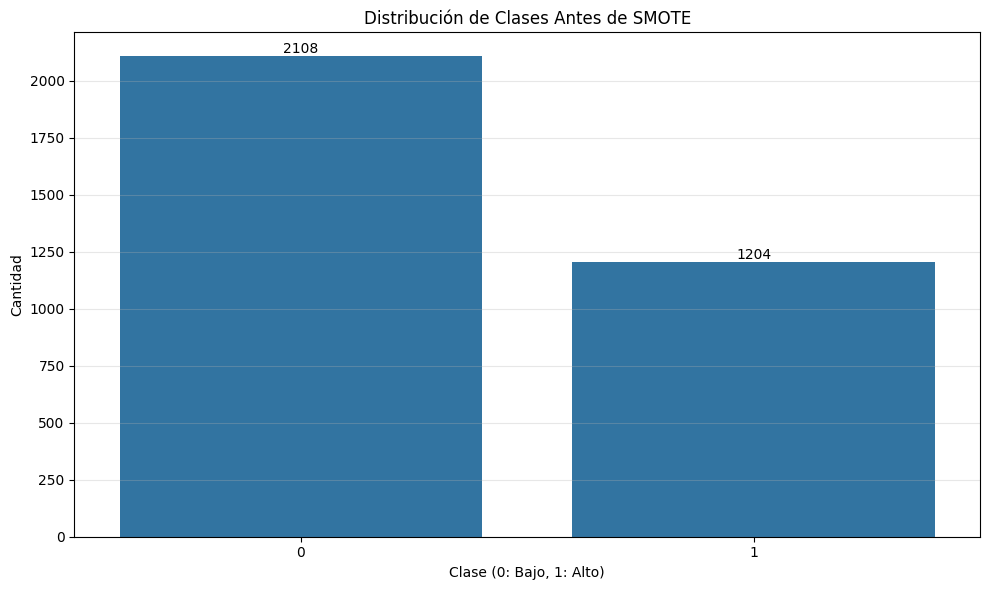

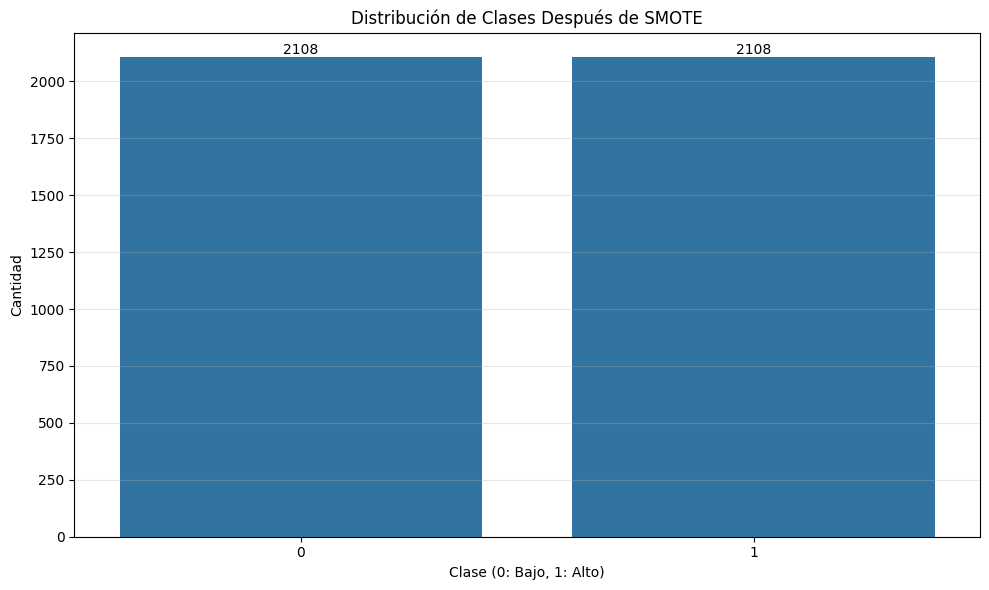

In [29]:
# Gráfico antes de aplicar SMOTE
plt.figure(figsize=(10, 6))
sns.countplot(data=pd.DataFrame({'target': y_train}), x='target')
plt.title('Distribución de Clases Antes de SMOTE')
plt.xlabel('Clase (0: Bajo, 1: Alto)')
plt.ylabel('Cantidad')

# Añadir valores sobre cada barra
for i in plt.gca().containers[0]:
    plt.text(i.get_x() + i.get_width()/2,
             i.get_height(),
             f'{int(i.get_height())}',
             ha='center', va='bottom')

plt.show()

# Crear un DataFrame con los datos balanceados
df_balanced = pd.DataFrame({'target': y_train_balanced})

# Gráfico después de aplicar SMOTE
plt.figure(figsize=(10, 6))
sns.countplot(data=df_balanced, x='target')
plt.title('Distribución de Clases Después de SMOTE')
plt.xlabel('Clase (0: Bajo, 1: Alto)')
plt.ylabel('Cantidad')

# Añadir valores sobre cada barra
for i in plt.gca().containers[0]:
    plt.text(i.get_x() + i.get_width()/2,
             i.get_height(),
             f'{int(i.get_height())}',
             ha='center', va='bottom')

plt.show()

## Iniciar entrenamiento
  - Modelo básico sin regularización
  - Modelo con regularización Ridge (L2)
  - Modelo con regularización Lasso (L1)

In [30]:
X_test

,bedrooms,bathrooms,sqft_living,sqft_lot,floors,waterfront,view,condition,sqft_above,sqft_basement,yr_built,yr_renovated
3877,-1.605368,0.428783,-1.404268,-0.377281,0.915066,0,0,2,-1.205521,-0.667345,1.197848,-0.861970
1084,0.639978,-0.199593,0.029173,-0.310123,-0.953429,0,0,2,-0.907398,1.837115,-2.345195,1.170794
68,0.639978,0.428783,-0.000900,-0.166999,0.915066,0,0,3,0.340301,-0.667345,0.495924,-0.861970
1748,-0.482695,0.428783,-1.203787,-0.386088,0.915066,0,0,2,-0.984689,-0.667345,1.097573,-0.861970
1858,1.762651,-0.199593,-0.221429,-0.248194,-0.019181,0,0,2,0.097386,-0.667345,-0.974773,1.134296
...,...,...,...,...,...,...,...,...,...,...,...,...
2155,1.762651,2.942289,1.663095,-0.195926,0.915066,0,0,2,2.173204,-0.667345,1.264698,-0.861970
4107,-2.728041,-1.142157,-1.053426,-0.399080,2.783561,0,0,2,-0.819065,-0.667345,1.465248,-0.861970
1864,-0.482695,0.428783,0.620592,-0.120126,0.915066,0,2,2,1.024879,-0.667345,0.729899,-0.861970
2637,-1.605368,-1.456346,-1.243883,-0.152081,-0.953429,0,0,3,-1.028856,-0.667345,0.362225,-0.861970


In [31]:
# --- ENTRENAMIENTO DE MODELOS ---

# Iteramos sobre cada modelo para entrenamiento y predicciones
for name, model in models.items():
   print(f"\n=== Entrenando modelo: {name} ===")

   # HIPERPARÁMETROS
   from sklearn.model_selection import GridSearchCV

   # Definir los hiperparámetros a evaluar
   param_grid = {
       'C': [0.01, 0.1, 1, 10, 100],  # Inverso de la fuerza de regularización
       'tol': [1e-4, 1e-3, 1e-2],  # Tolerancia para el criterio de parada
       'fit_intercept': [True, False],  # Si se incluye un término de sesgo/intercepto
       'solver': ['lbfgs', 'liblinear', 'saga'],  # Algoritmo de optimización
       'max_iter': [100, 200, 500]  # Número máximo de iteraciones
   }

   # Configurar GridSearchCV
   grid_search = GridSearchCV(
       estimator=model,
       param_grid=param_grid,
       scoring='accuracy',
       cv=5,  # Validación cruzada con 5 folds
       n_jobs=-1  # Usar todos los núcleos disponibles
   )

   grid_search.fit(X_train_balanced, y_train_balanced)  # Ajustar el modelo con los datos balanceados

   best_params = grid_search.best_params_  # Obtener los mejores hiperparámetros
   print(f"Mejores hiperparámetros: {best_params}")

   best_model = LogisticRegression(**best_params, random_state=RANDOM_STATE)  # Entrenar el mejor modelo con los hiperparámetros óptimos
   best_model.fit(X_train_balanced, y_train_balanced)

   # Realizar predicciones con el mejor modelo
   predictions[name] = best_model.predict(X_test)

   # Calcular probabilidades de la clase positiva (default)
   probabilities[name] = best_model.predict_proba(X_test)[:, 1]

   # Mostrar los coeficientes del modelo
   coef = pd.DataFrame({
       'Feature': X_train_balanced.columns,
       'Coefficient': best_model.coef_[0]
   }).sort_values('Coefficient', ascending=False)

   print("\nTop 5 características más importantes (coeficientes más altos):")
   print(coef.head())
   print("\nTop 5 características menos importantes (coeficientes más bajos):")
   print(coef.tail())

   # Calcular y mostrar el número de características con coeficiente cero (para Lasso)
   if name == "Logit Lasso":
       zero_coef = (abs(best_model.coef_[0]) < 1e-10).sum()
       print(f"\nNúmero de características con coeficiente cero: {zero_coef}")

# Calculamos y mostramos el tiempo de ejecución promedio para predicciones
import time

print("\n=== Evaluación de Tiempo de Predicción ===")
for name, model in models.items():
   times = []
   for _ in range(100):  # Realizamos 100 predicciones para obtener un promedio estable
       start_time = time.time()
       best_model.predict(X_test[:100])  # Usamos el mejor modelo para la predicción de 100 muestras
       times.append(time.time() - start_time)

   print(f"\n{name}:")
   print(f"Tiempo promedio de predicción: {np.mean(times)*1000:.2f} ms")
   print(f"Desviación estándar: {np.std(times)*1000:.2f} ms")


=== Entrenando modelo: Logit Básico ===


/usr/local/lib/python3.11/dist-packages/sklearn/model_selection/_validation.py:528: FitFailedWarning: 
450 fits failed out of a total of 1350.
The score on these train-test partitions for these parameters will be set to nan.
If these failures are not expected, you can try to debug them by setting error_score='raise'.

Below are more details about the failures:
--------------------------------------------------------------------------------
450 fits failed with the following error:
Traceback (most recent call last):
  File "/usr/local/lib/python3.11/dist-packages/sklearn/model_selection/_validation.py", line 866, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/usr/local/lib/python3.11/dist-packages/sklearn/base.py", line 1389, in wrapper
    return fit_method(estimator, *args, **kwargs)
           ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.11/dist-packages/sklearn/linear_model/_logistic.py", line 1193, in fit
    solver = _check_so

Mejores hiperparámetros: {'C': 0.01, 'fit_intercept': True, 'max_iter': 100, 'solver': 'saga', 'tol': 0.01}

Top 5 características más importantes (coeficientes más altos):
         Feature  Coefficient
2    sqft_living     0.816480
8     sqft_above     0.740647
1      bathrooms     0.322114
9  sqft_basement     0.309600
4         floors     0.190515

Top 5 características menos importantes (coeficientes más bajos):
         Feature  Coefficient
5     waterfront    -0.019664
11  yr_renovated    -0.042327
3       sqft_lot    -0.048337
0       bedrooms    -0.135622
10      yr_built    -0.571027

=== Entrenando modelo: Logit Ridge ===
Mejores hiperparámetros: {'C': 0.1, 'fit_intercept': True, 'max_iter': 100, 'solver': 'saga', 'tol': 0.001}

Top 5 características más importantes (coeficientes más altos):
         Feature  Coefficient
2    sqft_living     1.070572
8     sqft_above     0.987222
9  sqft_basement     0.376531
1      bathrooms     0.344101
4         floors     0.236080

Top 5 

/usr/local/lib/python3.11/dist-packages/sklearn/model_selection/_validation.py:528: FitFailedWarning: 
450 fits failed out of a total of 1350.
The score on these train-test partitions for these parameters will be set to nan.
If these failures are not expected, you can try to debug them by setting error_score='raise'.

Below are more details about the failures:
--------------------------------------------------------------------------------
450 fits failed with the following error:
Traceback (most recent call last):
  File "/usr/local/lib/python3.11/dist-packages/sklearn/model_selection/_validation.py", line 866, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/usr/local/lib/python3.11/dist-packages/sklearn/base.py", line 1389, in wrapper
    return fit_method(estimator, *args, **kwargs)
           ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.11/dist-packages/sklearn/linear_model/_logistic.py", line 1193, in fit
    solver = _check_so

Mejores hiperparámetros: {'C': 1, 'fit_intercept': True, 'max_iter': 100, 'solver': 'saga', 'tol': 0.01}

Top 5 características más importantes (coeficientes más altos):
         Feature  Coefficient
2    sqft_living     1.093029
8     sqft_above     1.007480
9  sqft_basement     0.385254
1      bathrooms     0.373778
4         floors     0.224377

Top 5 características menos importantes (coeficientes más bajos):
         Feature  Coefficient
5     waterfront    -0.063660
11  yr_renovated    -0.065656
3       sqft_lot    -0.099654
0       bedrooms    -0.341359
10      yr_built    -0.838134

Número de características con coeficiente cero: 0

=== Evaluación de Tiempo de Predicción ===

Logit Básico:
Tiempo promedio de predicción: 1.88 ms
Desviación estándar: 0.48 ms

Logit Ridge:
Tiempo promedio de predicción: 1.31 ms
Desviación estándar: 0.31 ms

Logit Lasso:
Tiempo promedio de predicción: 1.32 ms
Desviación estándar: 0.18 ms


# 📊 MÉTRICAS DE EVALUACIÓN

La evaluación exhaustiva de modelos de clasificación requiere un análisis desde múltiples perspectivas. Dividimos nuestras métricas de evaluación en dos categorías principales: Métricas tradicionales y Avanzadas

## 🎯 Métricas de Evaluación Tradicionales

Estas métricas fundamentales nos proporcionan una comprensión básica pero esencial del desempeño del modelo:

### Matriz de Confusión y sus Derivados

* **Accuracy** (0 a 1):
    * Proporción total de predicciones correctas
    * Valores más altos son mejores (> 0.7 suele ser aceptable)
    * Aunque útil, puede ser engañosa en datos desbalanceados
    * Ejemplo: Un accuracy de 0.95 indica que el 95% de todas las predicciones fueron correctas

* **Precision** (0 a 1):
    * Del total de casas que predecimos que tienen precio alto, cuántos realmente la tienen
    * Valores altos (> 0.6) indican que cuando predecimos que la casa tiene precio alto, solemos estar en lo correcto
    * Ejemplo: Una precision de 0.8 significa que de cada 10 casas que clasificamos como que tenían precio alto, 8 realmente la tienen

* **Recall** (0 a 1):
    * Del total de clientes que tienen casas , cuántos logramos identificar
    * Valores altos (> 0.6) indican que detectamos bien los defaults reales
    * Vital para minimizar pérdidas por defaults no detectados
    * Ejemplo: Un recall de 0.7 significa que detectamos el 70% de todos los defaults (casas con precio alto) reales

* **F1-Score** (0 a 1):
    * Media armónica entre Precisión y Recall
    * Valores más altos son mejores (> 0.6 suele ser bueno)
    * Proporciona un balance entre ambas métricas

### Curva ROC y AUC
* La curva ROC visualiza el balance entre verdaderos y falsos positivos a diferentes umbrales
* El AUC va de 0 a 1:
    * 0.5 indica un modelo aleatorio (línea diagonal)
    * > 0.7 se considera aceptable
    * > 0.8 se considera bueno
    * > 0.9 se considera excelente
* La prueba ROC-AUC nos ayuda a evaluar y mejorar nuestro modelo de predicción de precios altos en casas, permitiéndonos elegir el umbral de clasificación óptimo y comparar diferentes modelos de manera objetiva. 🚀




=== Tabla Comparativa de Métricas ===
      Modelo  Accuracy  Precision  Recall  F1-Score  AUC-ROC
Logit Básico    0.7874     0.7023  0.7209    0.7115   0.8596
 Logit Ridge    0.7826     0.6945  0.7176    0.7059   0.8600
 Logit Lasso    0.7838     0.6968  0.7176    0.7070   0.8583

=== Matrices de Confusión ===


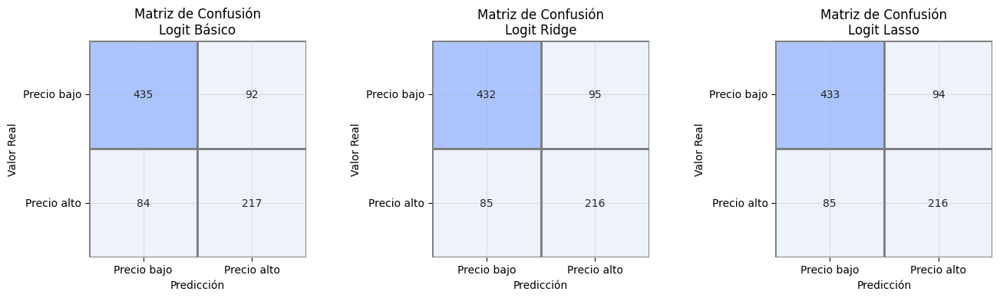


=== Curvas ROC ===


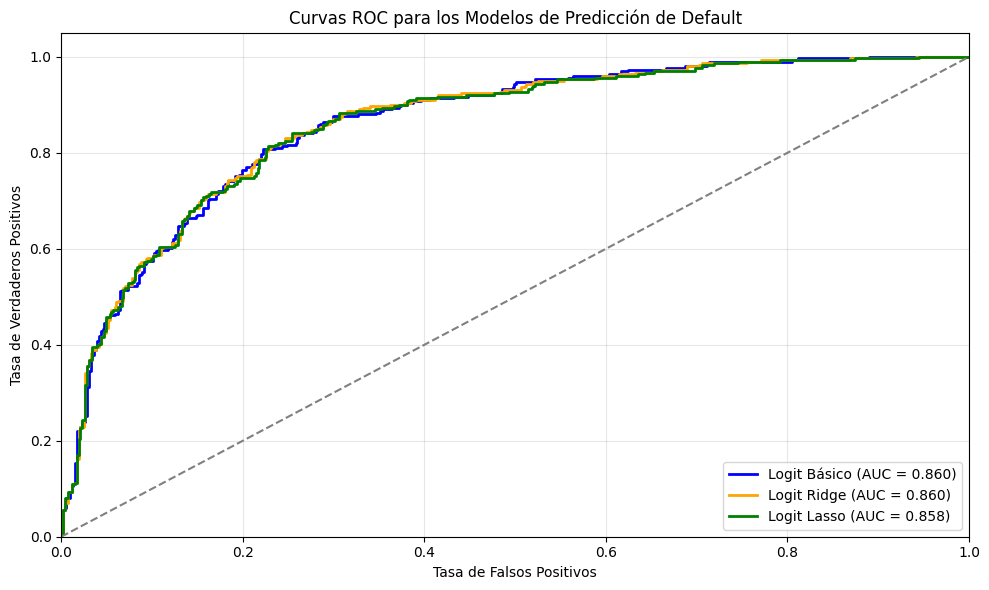

In [32]:
# --- Evaluación y Métricas Tradicionales ---
import pandas as pd
import numpy as np
import seaborn as sns
import matplotlib.pyplot as plt
from sklearn.metrics import (
    confusion_matrix, classification_report, accuracy_score,
    precision_score, recall_score, f1_score, roc_auc_score, roc_curve
)

class ModelEvaluator:
    def __init__(self, y_true, predictions, probabilities):
        """
        Inicializa el evaluador con los datos necesarios.
        """
        self.y_true = y_true
        self.predictions = predictions
        self.probabilities = probabilities
        self.colors = ["#EDF2FB", "#ABC4FF"]  # Paleta de colores para visualizaciones

    def create_metrics_table(self):
        """
        Crea una tabla comparativa con todas las métricas de los modelos.
        """
        metrics = []
        for name in self.predictions.keys():
            metrics.append({
                'Modelo': name,
                'Accuracy': accuracy_score(self.y_true, self.predictions[name]),
                'Precision': precision_score(self.y_true, self.predictions[name], zero_division=0),
                'Recall': recall_score(self.y_true, self.predictions[name]),
                'F1-Score': f1_score(self.y_true, self.predictions[name]),
                'AUC-ROC': roc_auc_score(self.y_true, self.probabilities[name])
            })

        return pd.DataFrame(metrics).round(4)

    def plot_confusion_matrices(self):
        """
        Visualiza las matrices de confusión para cada modelo.
        """
        n_models = len(self.predictions)
        fig, axes = plt.subplots(1, n_models, figsize=(5*n_models, 4))
        if n_models == 1:
            axes = [axes]

        cmap = sns.color_palette(self.colors, as_cmap=True)

        for idx, (name, y_pred) in enumerate(self.predictions.items()):
            cm = confusion_matrix(self.y_true, y_pred)

            sns.heatmap(
                cm,
                annot=True,
                fmt='d',
                ax=axes[idx],
                cmap=cmap,
                cbar=False,
                linewidths=1,
                linecolor='gray',
                square=True
            )

            axes[idx].set_title(f'Matriz de Confusión\n{name}')
            axes[idx].set_xlabel('Predicción')
            axes[idx].set_ylabel('Valor Real')
            axes[idx].set_xticklabels(['Precio bajo', 'Precio alto'])
            axes[idx].set_yticklabels(['Precio bajo', 'Precio alto'], rotation=0)

        plt.tight_layout()
        return fig

    def plot_roc_curves(self):
        """
        Visualiza las curvas ROC para múltiples modelos.
        """
        fig, ax = plt.subplots(figsize=(10, 6))
        colors = ['blue', 'orange', 'green']

        for (name, probs), color in zip(self.probabilities.items(), colors):
            fpr, tpr, _ = roc_curve(self.y_true, probs)
            auc = roc_auc_score(self.y_true, probs)
            ax.plot(fpr, tpr, color=color, lw=2,
                   label=f'{name} (AUC = {auc:.3f})')

        ax.plot([0, 1], [0, 1], color='gray', linestyle='--')
        ax.set(xlim=[0.0, 1.0], ylim=[0.0, 1.05],
               xlabel='Tasa de Falsos Positivos',
               ylabel='Tasa de Verdaderos Positivos',
               title='Curvas ROC para los Modelos de Predicción de Default')
        ax.legend(loc="lower right")
        ax.grid(True, alpha=0.3)

        return fig

    def evaluate_all(self):
        """
        Ejecuta todas las evaluaciones y muestra los resultados.
        """
        # Tabla de métricas
        metrics_table = self.create_metrics_table()
        print("\n=== Tabla Comparativa de Métricas ===")
        print(metrics_table.to_string(index=False))

        # Matrices de confusión
        print("\n=== Matrices de Confusión ===")
        self.plot_confusion_matrices()
        plt.show()

        # Curvas ROC
        print("\n=== Curvas ROC ===")
        self.plot_roc_curves()
        plt.show()

# Uso del evaluador
evaluator = ModelEvaluator(y_test, predictions, probabilities)
evaluator.evaluate_all()

## 📊 Análisis de Métricas Tradicionales

## Visión general: Comportamiento de los 3 Modelos

Los modelos Logit Básico, Logit Ridge y Logit Lasso muestran un desempeño muy similar en la clasificación del precio de una vivienda como alto o bajo. A partir de las matrices de confusión, podemos observar:

* Alta precisión en la predicción de precios bajos, con aproximadamente 433-435 verdaderos negativos (casas con precio bajo correctamente clasificadas).
* Desempeño más limitado en la identificación de precios altos, con alrededor de 216-217 verdaderos positivos.
* Errores consistentes entre los modelos, con entre 84-85 falsos negativos y 92-95 falsos positivos.

## Visión detallada

### Matriz de Confusión y Métricas
#### Logit Básico
* Matriz de confusión
  * TN = 435, FP = 92
  * FN = 84, TP = 217

#### Logit Ridge
* Matriz de confusión
  * TN = 432, FP = 95
  * FN = 85, TP = 216

#### Logit Lasso
* Matriz de confusión
  * TN = 433, FP = 94
  * FN = 85, TP = 216

### Interpretación de Resultados: Logit Básico como mejor modelo

El modelo Logit Básico obtiene la mayor exactitud (78.8%), y también alcanza la mejor combinación de precisión (70.2%) y recall (72.1%), resultando en el F1-Score más alto (71.1%).

Esto indica que, para este conjunto de datos, la regularización (Ridge o Lasso) no aportó una mejora significativa y, de hecho, el modelo sin regularización terminó siendo ligeramente superior.

### Diferencias mínimas pero consistentes

Si bien las diferencias entre los tres modelos no son enormes (todas rondan entre 78% y 79% de accuracy), la ventaja del modelo básico se mantiene en la mayoría de las métricas clave.

### Interpretación de la Matriz de Confusión

* Verdaderos positivos (TP): El Logit Básico clasifica correctamente la mayor cantidad de casas de precio alto (217), superando levemente a Ridge y Lasso (216).
* Verdaderos negativos (TN): También mantiene un valor ligeramente superior (435) frente a los otros dos modelos.
* Falsos positivos (FP) y falsos negativos (FN): Son ligeramente menores en el modelo básico, lo que se traduce en menos errores de clasificación.

### Conclusiones Prácticas
Si la prioridad es la exactitud global y el balance entre precios altos y bajos, el Logit Básico se presenta como la mejor opción según estos resultados.

Si fuera necesaria una mayor interpretabilidad de las variables (por ejemplo, entender cuáles características influyen más en el precio), los modelos Lasso o Ridge podrían seguir siendo útiles, ya que la regularización puede simplificar la selección de variables.
Posible sobreajuste: Es importante verificar si el modelo básico pudiera estar sobreajustado. Sin embargo, los datos indican que, al menos en las métricas mostradas hasta acá, su rendimiento es estable.

En síntesis, el Logit Básico se ubica como el modelo con mejor desempeño en este escenario, demostrando un equilibrio óptimo entre la identificación de precios altos y bajos en la base de datos analizada.


## Diferencias mínimas en AUC

El Logit Básico y el Logit Ridge alcanzan un AUC de 0.860, mientras que el Logit Lasso queda muy cerca, con 0.858.
Estas diferencias son tan pequeñas que, en la práctica, podríamos considerarlas casi equivalentes.

### Balance entre Tasa de Verdaderos Positivos y Falsos Positivos

Las curvas ROC evidencian un balance muy similar entre la tasa de verdaderos positivos (TPR) y la tasa de falsos positivos (FPR) para cada modelo.
Esto sugiere que, a la hora de ajustar el umbral de clasificación, cualquiera de los tres tendría un desempeño muy parecido.

### Conclusión

Desde la perspectiva de la capacidad de discriminación, no hay un claro ganador; todos se desempeñan de manera estable.
Por lo tanto, el modelo básico, que ofrece ventajas en las métricas de la matriz de confusión, tiene mejor AUC que Lasso, y es más sencillo, sería el modelo más efectivo al momento.


## 🔍 Métricas de Evaluación Avanzadas

Estas métricas proporcionan insights más profundos sobre el comportamiento y robustez de nuestros modelos:






### 🎯 Entropía
La entropía en machine learning mide la incertidumbre o "duda" en las predicciones de nuestros modelos. Un valor de entropía:
- Cercano a 0: El modelo está muy seguro de sus predicciones
- Cercano a 1: El modelo tiene mucha incertidumbre
- El máximo para clasificación binaria es ln(2) ≈ 0.693



=== Análisis de Entropía ===

Entropía media para Logit Básico: 0.5148

Entropía media para Logit Ridge: 0.4698

Entropía media para Logit Lasso: 0.4659


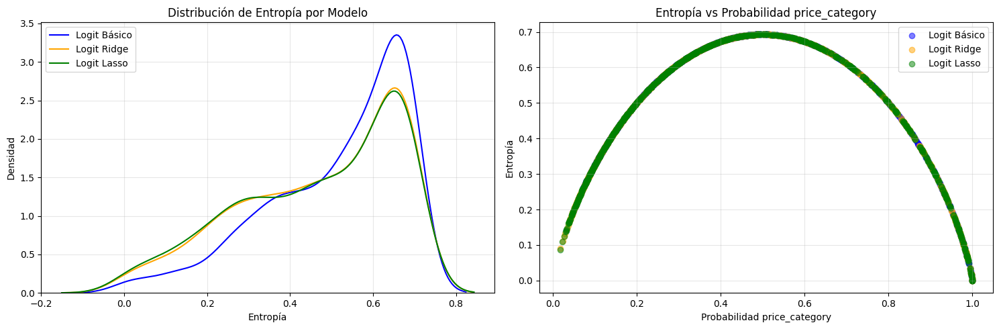


Entropía media por clase real:

Logit Básico:
Clase 0: 0.5262
Clase 1: 0.4949

Logit Ridge:
Clase 0: 0.4800
Clase 1: 0.4518

Logit Lasso:
Clase 0: 0.4770
Clase 1: 0.4463


In [33]:
# --- Entropía ---

import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from scipy.stats import entropy
from sklearn.model_selection import train_test_split
from sklearn.ensemble import RandomForestClassifier
from sklearn.datasets import make_classification

def calculate_entropy(probabilities):
    """
    Calcula la entropía de las predicciones.
    probabilities: array de probabilidades de la clase positiva (default)
    """
    p = np.vstack([1 - probabilities, probabilities]).T
    return entropy(p, axis=1)

def analyze_entropy(y_true, probabilities):
    """
    Analiza y visualiza la entropía de las predicciones de los modelos
    """
    # Calcular entropía para cada modelo
    entropy_dict = {}
    mean_entropy_dict = {}

    for name, probs in probabilities.items():
        entropy_vals = calculate_entropy(probs)
        entropy_dict[name] = entropy_vals
        mean_entropy_dict[name] = np.mean(entropy_vals)
        print(f"\nEntropía media para {name}: {mean_entropy_dict[name]:.4f}")

    # Crear subplot con dos gráficas
    fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(15, 5))

    # 1️⃣ Distribución de entropía
    colors = ['blue', 'orange', 'green']
    for (name, entropy_vals), color in zip(entropy_dict.items(), colors):
        sns.kdeplot(data=entropy_vals, label=name, ax=ax1, color=color)
    ax1.set_title('Distribución de Entropía por Modelo')
    ax1.set_xlabel('Entropía')
    ax1.set_ylabel('Densidad')
    ax1.legend()

    # 2️⃣ Entropía vs Probabilidad predicha
    for (name, entropy_vals), color in zip(entropy_dict.items(), colors):
        ax2.scatter(probabilities[name], entropy_vals, alpha=0.5, label=name, color=color)
    ax2.set_title('Entropía vs Probabilidad price_category')
    ax2.set_xlabel('Probabilidad price_category')
    ax2.set_ylabel('Entropía')
    ax2.legend()

    plt.tight_layout()
    plt.show()

    # 3️⃣ Análisis adicional: Entropía por clase real
    print("\nEntropía media por clase real:")
    for name, entropy_vals in entropy_dict.items():
        print(f"\n{name}:")
        for clase in [0, 1]:
            mask = (y_true == clase)

            # Verificar dimensiones antes de indexar
            if mask.shape[0] != entropy_vals.shape[0]:
                print(f"⚠️ Error: Dimensión de mask ({mask.shape[0]}) ≠ entropy_vals ({entropy_vals.shape[0]})")
                continue

            mean_entropy = np.mean(entropy_vals[mask])
            print(f"Clase {clase}: {mean_entropy:.4f}")

# 5️⃣ Ejecutar el análisis con los datos correctos
print("=== Análisis de Entropía ===")
analyze_entropy(y_test, probabilities)

### 📊 Interpretación de Gráficas de Entropía en Modelos de Regresión Logística

### 📘 Guía de Lectura e Interpretación

### 1️⃣ Distribución de Entropía por Modelo (Gráfica Izquierda)
* **Eje X (Entropía)**
  - Rango: 0.0 a 0.8
  - Interpretación: 0 indica certeza total, 0.8 indica máxima incertidumbre

* **Eje Y (Densidad)**
  - Representa la frecuencia relativa de cada valor de entropía
  - Picos más altos indican valores más comunes

### 2️⃣ Entropía vs Probabilidad de Default (Gráfica Derecha)
* **Eje X (Probabilidad)**
  - Rango: 0 a 1
  - Representa la probabilidad predicha de default

* **Eje Y (Entropía)**
  - Muestra el nivel de incertidumbre para cada predicción
  - Valores más bajos indican mayor certeza

## 🔍 Análisis de Resultados

### Diferencia en la Entropía Promedio
Logit Básico: Entropía media = 0.5148

Logit Ridge: Entropía media = 0.4698

Logit Lasso: Entropía media = 0.4659

La entropía mide el grado de “incertidumbre” o “dispersión” en las probabilidades de predicción de cada clase. Un valor más alto implica que el modelo está menos seguro (sus probabilidades están más cercanas al 0.5), mientras que un valor más bajo indica mayor confianza (probabilidades más cercanas a 0 o 1).

El Logit Básico muestra la entropía media más alta, es decir, en promedio sus predicciones son menos “decididas” y más cercanas al 0.5.

Ridge y Lasso tienen valores de entropía muy similares y menores que el Básico, lo que sugiere que son más “confiados” en sus predicciones.

### Entropía por Clase Real
Para las clases reales (0 = precio bajo, 1 = precio alto), se observa el mismo patrón: la entropía es ligeramente mayor cuando la clase real es 0.

Logit Básico
Clase 0 (precio bajo): 0.5262
Clase 1 (precio alto): 0.4949

Logit Ridge
Clase 0: 0.4800
Clase 1: 0.4518

Logit Lasso
Clase 0: 0.4770
Clase 1: 0.4463

En todos los casos, el modelo tiene más incertidumbre al predecir casas de precio bajo.

Posiblemente:
* La clase de precio bajo sea más heterogénea, dificultando su clasificación precisa.
* Los modelos están ajustados de forma que se “inclinan” a ser más seguros en la clase de precio alto, donde quizá las características sean más distintivas (por ejemplo, número de habitaciones, ubicación premium, etc.).

### Interpretación de los Gráficos
Distribución de la Entropía por Modelo (gráfico de la izquierda)
Se ve cómo la curva del Logit Básico está desplazada levemente hacia valores de entropía más altos, confirmando su mayor “incertidumbre” promedio.
Las curvas de Ridge y Lasso se encuentran más hacia la izquierda, indicando menor entropía (más confianza en las predicciones).
Entropía vs. Probabilidad de “price_category” (gráfico de la derecha)
La forma de “U” invertida es esperable: la entropía es baja cuando la probabilidad está cerca de 0 o 1, y alcanza su máximo cerca de 0.5.
Se aprecia que Ridge y Lasso concentran más puntos en los extremos (probabilidades más cercanas a 0 o 1) y, por ende, muestran menor entropía.
El Básico presenta más puntos alrededor de 0.5, reflejando la mayor media de entropía.

### Conclusiones Generales
Confianza vs. Exactitud

Aunque el Logit Básico obtuvo una ligera ventaja en exactitud, sus probabilidades de predicción están más “dispersas” (entropía más alta).
Ridge y Lasso ofrecen predicciones más “decididas” (menor entropía), pero con un desempeño muy similar en métricas de clasificación.
Interpretabilidad y Regularización

Lasso y Ridge, al regularizar, suelen concentrar las probabilidades más cerca de 0 o 1, lo que puede traducirse en mayor confianza.
En este caso, la regularización no aumentó drásticamente la exactitud, pero sí redujo la incertidumbre en las predicciones.
Aplicaciones Prácticas

Si se valora la confianza en cada predicción (por ejemplo, para tomar decisiones con cierto nivel de riesgo), los modelos regularizados pueden resultar más útiles.
Si el objetivo principal es la exactitud global, el modelo básico (incluso con su mayor entropía) puede ser una buena elección, siempre y cuando esa pequeña diferencia en rendimiento sea relevante en el contexto de negocio.
En síntesis, las curvas de entropía confirman que Ridge y Lasso son más “confiados” en sus predicciones, mientras que el modelo básico mantiene un desempeño ligeramente superior en métricas como exactitud, pero con mayor incertidumbre en la asignación de probabilidades.

## 🎯 Validación Cruzada en Clasificación de Casas con precio alto

La validación cruzada es una técnica estadística que nos permite evaluar la capacidad real de nuestros modelos para predecir nuevos casos. En lugar de confiar en una única división de datos de entrenamiento y prueba, la validación cruzada divide sistemáticamente nuestros datos en múltiples subconjuntos, entrena y evalúa el modelo varias veces, proporcionando una estimación más robusta y confiable de su rendimiento.

## 🔄 Enfoques de Validación Cruzada que Implementaremos

### 1. Validación Cruzada K-Fold 📊
- Divide los datos en K partes iguales
- Entrena el modelo K veces, usando cada parte como conjunto de prueba una vez
- Nos da una visión general de la estabilidad del modelo
- Revela qué tan bien generaliza nuestro modelo a diferentes subconjuntos de datos

### 2. Validación Cruzada Estratificada 📈
- Similar al K-Fold, pero mantiene la proporción de clases en cada división
- Especialmente importante dado nuestro desbalance entre buenos pagadores y defaults
- Proporciona una evaluación más realista del rendimiento en casos de default
- Ayuda a entender mejor cómo maneja el modelo los casos minoritarios pero críticos

## 📊 Curvas de Aprendizaje: La Historia de Cómo Aprende Nuestro Modelo

Las curvas de aprendizaje son como el diario de desarrollo de nuestro modelo, contándonos la historia de cómo mejora (o no) a medida que le proporcionamos más datos. Estas curvas son especialmente reveladoras, ya que nos ayudan a entender si nuestro modelo está realmente aprendiendo a identificar patrones de características de casas de manera efectiva.




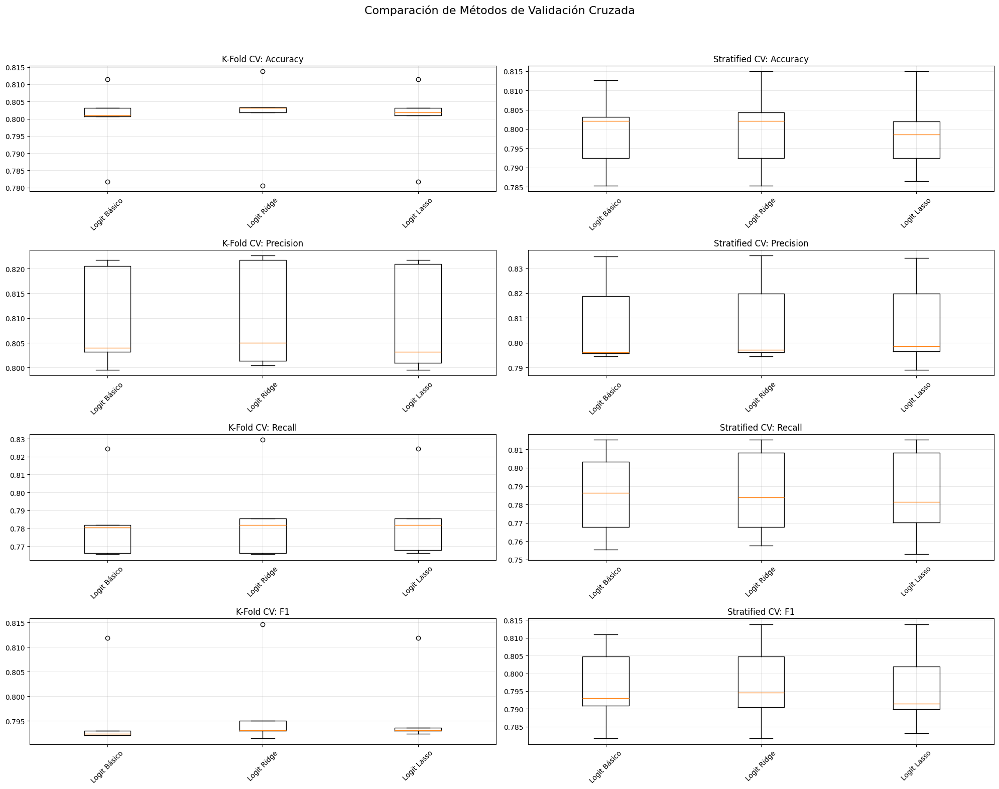

In [34]:
# Importación de bibliotecas necesarias
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from sklearn.model_selection import KFold, StratifiedKFold, cross_validate, learning_curve
from sklearn.metrics import make_scorer, precision_score, recall_score, f1_score

# Configuración global del ambiente
# RANDOM_STATE asegura reproducibilidad en los resultados
RANDOM_STATE = 42

# Configuración del estilo de visualización de matplotlib
plt.rcParams.update({
    'figure.autolayout': True,  # Ajuste automático del layout
    'axes.grid': True,          # Mostrar cuadrícula en los gráficos
    'grid.alpha': 0.3           # Transparencia de la cuadrícula
})

def get_cross_validation_results(models, X, y, k=5):
    """
    Realiza validación cruzada K-Fold y Estratificada para múltiples modelos.

    Parámetros:
    -----------
    models : dict
        Diccionario con los modelos a evaluar {nombre_modelo: modelo}
    X : array-like
        Características del dataset
    y : array-like
        Variable objetivo
    k : int, default=5
        Número de folds para la validación cruzada

    Retorna:
    --------
    tuple
        (resultados_kfold, resultados_estratificados)
        Cada elemento contiene los scores de las métricas para cada modelo
    """
    # Definición de métricas de evaluación
    scoring = {
        'accuracy': 'accuracy',                          # Exactitud general
        'precision': make_scorer(precision_score),       # Precisión (verdaderos positivos)
        'recall': make_scorer(recall_score),            # Recall (sensibilidad)
        'f1': make_scorer(f1_score)                     # F1-Score (media armónica)
    }

    # Inicialización de diccionarios para almacenar resultados
    kfold_results = {}
    stratified_results = {}

    # Creación de objetos de validación cruzada
    kfold = KFold(n_splits=k, shuffle=True, random_state=RANDOM_STATE)
    stratified = StratifiedKFold(n_splits=k, shuffle=True, random_state=RANDOM_STATE)

    # Iteración sobre cada modelo para realizar validación cruzada
    for name, model in models.items():
        # Validación K-Fold estándar
        kfold_results[name] = cross_validate(
            model, X, y,
            scoring=scoring,
            cv=kfold,
            return_train_score=True  # También obtener scores de entrenamiento
        )

        # Validación estratificada (mantiene proporción de clases)
        stratified_results[name] = cross_validate(
            model, X, y,
            scoring=scoring,
            cv=stratified,
            return_train_score=True
        )

    return kfold_results, stratified_results

def plot_boxplots_comparison(kfold_results, stratified_results):
    """
    Genera visualización comparativa de boxplots para ambos tipos de validación cruzada.

    Parámetros:
    -----------
    kfold_results : dict
        Resultados de la validación cruzada K-Fold
    stratified_results : dict
        Resultados de la validación cruzada estratificada

    Genera:
    -------
    Figura con 8 subplots (4 métricas x 2 tipos de CV)
    """
    # Definición de métricas a visualizar
    metrics = ['test_accuracy', 'test_precision', 'test_recall', 'test_f1']

    # Creación de la figura principal
    fig = plt.figure(figsize=(20, 16))
    plt.subplots_adjust(top=0.9)  # Ajuste para el título principal

    # Generación de subplots para cada métrica y tipo de CV
    for idx, metric in enumerate(metrics):
        # Subplot para K-Fold
        ax1 = plt.subplot(4, 2, 2*idx + 1)
        data_kfold = [kfold_results[model][metric] for model in kfold_results.keys()]
        ax1.boxplot(data_kfold)
        ax1.set_xticklabels(list(kfold_results.keys()), rotation=45)
        ax1.set_title(f'K-Fold CV: {metric.replace("test_", "").capitalize()}')
        ax1.grid(True, alpha=0.3)

        # Subplot para CV Estratificada
        ax2 = plt.subplot(4, 2, 2*idx + 2)
        data_strat = [stratified_results[model][metric] for model in stratified_results.keys()]
        ax2.boxplot(data_strat)
        ax2.set_xticklabels(list(stratified_results.keys()), rotation=45)
        ax2.set_title(f'Stratified CV: {metric.replace("test_", "").capitalize()}')
        ax2.grid(True, alpha=0.3)

    # Ajustes finales de la figura
    plt.suptitle('Comparación de Métodos de Validación Cruzada', y=0.98, fontsize=16)
    plt.tight_layout(rect=[0, 0, 1, 0.95])
    plt.show()

def plot_learning_curves_comparison(models, X, y):
    """
    Genera curvas de aprendizaje comparativas para múltiples modelos.

    Parámetros:
    -----------
    models : dict
        Diccionario con los modelos a evaluar {nombre_modelo: modelo}
    X : array-like
        Características del dataset
    y : array-like
        Variable objetivo

    Genera:
    -------
    Figura con tres subplots, uno para cada modelo
    """
    # Configuración de la validación cruzada estratificada
    cv = StratifiedKFold(n_splits=5, shuffle=True, random_state=RANDOM_STATE)

    # Creación de la figura
    fig = plt.figure(figsize=(20, 6))

    # Generación de curvas de aprendizaje para cada modelo
    for idx, (name, model) in enumerate(models.items(), 1):
        plt.subplot(1, 3, idx)

        # Cálculo de las curvas de aprendizaje
        train_sizes, train_scores, val_scores = learning_curve(
            model, X, y,
            train_sizes=np.linspace(0.1, 1.0, 10),  # 10 puntos entre 10% y 100% del dataset
            cv=cv,
            scoring='f1',    # Usando F1-score como métrica
            n_jobs=-1        # Usar todos los núcleos disponibles
        )

        # Cálculo de estadísticas
        train_mean = np.mean(train_scores, axis=1)
        train_std = np.std(train_scores, axis=1)
        val_mean = np.mean(val_scores, axis=1)
        val_std = np.std(val_scores, axis=1)

        # Visualización de las curvas
        plt.plot(train_sizes, train_mean, label='Training score', color='blue')
        plt.plot(train_sizes, val_mean, label='Cross-validation score', color='red')

        # Añadir bandas de desviación estándar
        plt.fill_between(train_sizes, train_mean - train_std,
                        train_mean + train_std, alpha=0.1, color='blue')
        plt.fill_between(train_sizes, val_mean - val_std,
                        val_mean + val_std, alpha=0.1, color='red')

        # Configuración del subplot
        plt.title(f'Learning Curves\n{name}')
        plt.xlabel('Training Examples')
        plt.ylabel('F1 Score')
        plt.legend(loc='lower right')
        plt.grid(True, alpha=0.3)

    # Ajustes finales de la figura
    plt.suptitle('Curvas de Aprendizaje por Modelo', y=1.05, fontsize=16)
    plt.tight_layout()
    plt.show()

# Para generar los boxplots:
kfold_results, stratified_results = get_cross_validation_results(models, X_train_balanced, y_train_balanced)
plot_boxplots_comparison(kfold_results, stratified_results)



# 📊 Interpretación de Diagramas de Validación Cruzada

## 📘 Guía de Lectura de Boxplots

### Elementos Fundamentales
* **Línea central (mediana)**: Representa el rendimiento típico de cada modelo logístico
* **Caja**: Contiene el 50% central de los resultados de validación  
* **Bigotes**: Muestran el rango completo de rendimiento, excluyendo outliers
* **Puntos**: Identifican resultados atípicos en las validaciones

### Claves de Interpretación
* **Altura de la Caja**
  - Cajas compactas (como en Logit Lasso) indican predicciones consistentes
  - Cajas más altas (como en modelos básico y Ridge) sugieren mayor variabilidad

* **Posición de la Mediana**
  - Más elevada indica mejor desempeño general
  - Alineación dentro de la caja sugiere distribución balanceada de resultados

## 🔍 Análisis de Resultados

### Accuracy y Estabilidad
El análisis de accuracy en K-fold muestra que los tres modelos se comportan de manera casi igual, mientras que en el stratified se logra ver que el modelo Lasso es el que tiene menos variabilidad por el tamaño de la caja y el modelo Ridge tiene una mediana más alta que Lasso, pero con poca diferencia frente a la del básico. Por lo tanto, se podría decir que en cuanto la accuracy son los modelos Lasso y Ridge los que mejor desempeño tienen.

### Precision y Recall
Para la métrica de precisión podemos observar que el modelo básico podría ser el que mejor desempeño tiene, ya que a pesar de que todos tienen una variación bastante amplia, este modelo parece ser el que menos tiene tanto en K-fold como en stratified. Por otro lado, con la métrica Recall pasa algo parecido, ya que el modelo básico no solo tiene la menor variación de los tres modelos en ambas métricas, pero en stratified tiene la mediana más alta por lo que se vuelve el modelo con mejor desempeño en Recall.

### Comparación entre Validaciones
La validación K-fold tiene resultados con mucha menos variación, como se puede observar por los tamaños de las cajas en accuracy (Hiperparámetro), Recall y F1-score, aunque en comparación con stratified se encuentran varios valores atípicos. Se puede decir que K-fold parece ser la mejor opción.

### Rendimiento del F1-Score
En el caso de F1-Score se podría decir que el mejor modelo es el Lasso ya que, aunque tiene el mismo tamaño que el básico en K-fold, en stratified parece tener menor variación que el básico. En este caso Ridge tiene una mediana mayor pero el tamaño de la caja en K-fold lo vuelve un modelo no tan atractivo, ya que tiene mayor diferencia de variación que los otros dos.

#### Nota
La validación K-fold se ve como la mejor opción ya que contiene los resultados más consistentes, mientras que los valores atípicos pueden ser causados por que la base de datos ya que no tiene tantas muestras.


### Curvas de Aprendizaje

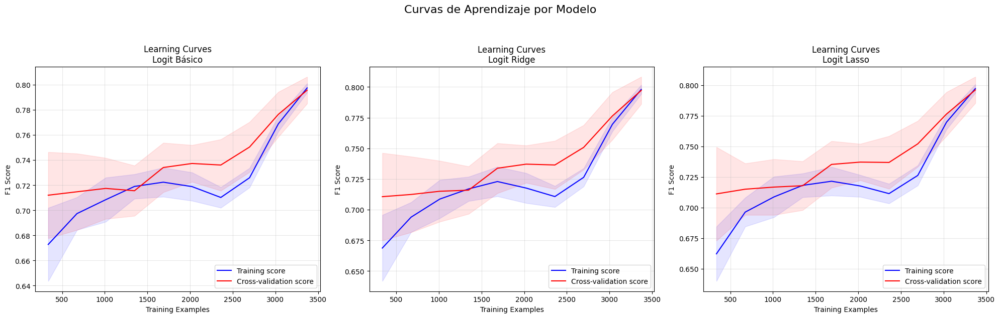

In [35]:
# Para generar las curvas de aprendizaje:
plot_learning_curves_comparison(models, X_train_balanced, y_train_balanced)

### 📊 Interpretación de Curvas de Aprendizaje

### 📘 Guía de Lectura

### Elementos Fundamentales
* **Línea Azul (Training Score)**: Rendimiento en datos de entrenamiento
* **Línea Roja (Cross-validation Score)**: Rendimiento en datos de validación
* **Área Sombreada**: Representa la variabilidad/incertidumbre del modelo

### Interpretación de Ejes
* **Eje X**: Número de ejemplos de entrenamiento (1000-8000)
* **Eje Y**: F1-Score (métrica de rendimiento combinada)

### 🔍 Análisis de Resultados

### Comportamiento de los tres modelos
Se puede observar en las tres gráficas que todas siguen un comportamiento similar donde primero existe una diferencia importante entre el entrenamiento, la cual empieza alrededor de 0.670, y la validación que comienza alrededor de 0.71 de F1-score, pero a medida que se van añadiendo datos las dos curvas van convergiendo hasta que al final terminan bastante cerca de la otra en un F1-score de 0.80.

### Implicaciones Prácticas
Los tres modelos muestran una gran capacidad de aprendizaje que se beneficia de que se le administren más datos, lo cual es perfecto para un modelo de categorización como el que queríamos crear. Se puede llegar a analizar la variación de cada uno de los modelos, pero a simple vista ninguno parece tener una gran diferencia frente los otros como para justificar la preferencia de alguno de los tres.

**BONO**

Evaluando diferentes números de clusters...


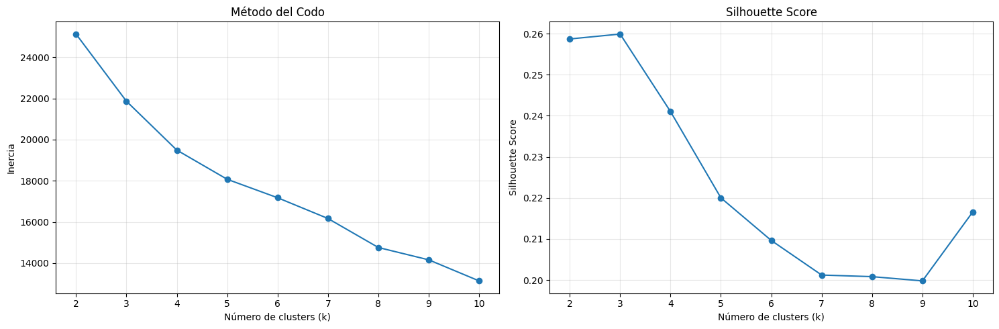

In [36]:
# Preprocesamiento y modelos
from sklearn.preprocessing import StandardScaler # Para estandarizar variables
from sklearn.decomposition import PCA            # Para reducción de dimensionalidad
from sklearn.cluster import KMeans               # Para clustering
from sklearn.metrics import silhouette_score     # Para evaluar calidad del clustering

def find_optimal_clusters(X, max_clusters=10):
    """
    Encuentra el número óptimo de clusters usando dos métodos:
    1. Método del codo
    2. Silhouette score

    Args:
        X: matriz de datos estandarizados
        max_clusters: número máximo de clusters a probar

    Returns:
        tuple: (inertias, silhouette_scores)
    """
    inertias = []          # Para método del codo
    silhouette_scores = [] # Para score de silueta

    print("Evaluando diferentes números de clusters...")
    for k in range(2, max_clusters + 1):
        # Entrenamiento de K-means
        kmeans = KMeans(n_clusters=k, random_state=RANDOM_STATE)
        kmeans.fit(X)

        # Guardar métricas
        inertias.append(kmeans.inertia_)
        silhouette_scores.append(silhouette_score(X, kmeans.labels_))

    # Visualización de resultados
    fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(15, 5))

    # Gráfico del método del codo
    ax1.plot(range(2, max_clusters + 1), inertias, marker='o')
    ax1.set_title('Método del Codo')
    ax1.set_xlabel('Número de clusters (k)')
    ax1.set_ylabel('Inercia')
    ax1.grid(True)

    # Gráfico del Silhouette score
    ax2.plot(range(2, max_clusters + 1), silhouette_scores, marker='o')
    ax2.set_title('Silhouette Score')
    ax2.set_xlabel('Número de clusters (k)')
    ax2.set_ylabel('Silhouette Score')
    ax2.grid(True)

    plt.tight_layout()
    plt.show()

#     return inertias, silhouette_scores
find_optimal_clusters(X_train)

Aqui manuela analiza y selecciona un numero de agrupaciones


=== Aplicación de K-means ===
Aplicando K-means estándar...
Aplicando PCA + K-means...
Número de componentes seleccionados por PCA (95% varianza): 8

=== Visualización de Resultados ===
Preparando visualización t-SNE...


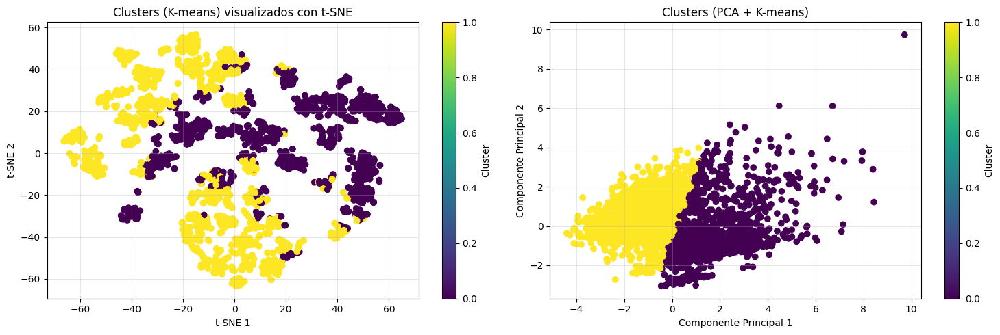


=== Métricas de Rendimiento ===
Silhouette Score (K-means): 0.259
Silhouette Score (PCA + K-means): 0.437
Varianza explicada por PCA: 57.16%


In [47]:
from sklearn.manifold import TSNE


def apply_clustering(X, n_clusters=3):
    """
    Aplica K-means clustering de dos formas:
    1. K-means estándar sobre los datos originales
    2. K-means sobre datos reducidos con PCA

    Args:
        X: matriz de datos estandarizados
        n_clusters: número de clusters a crear

    Returns:
        tuple: (kmeans_labels, kmeans_pca_labels, X_pca, pca_explained_variance_ratio)
    """
    # 1. K-means estándar
    print("Aplicando K-means estándar...")
    kmeans = KMeans(n_clusters=n_clusters, random_state=RANDOM_STATE)
    kmeans_labels = kmeans.fit_predict(X)

    # 2. PCA + K-means
    print("Aplicando PCA + K-means...")

    # Determinamos el número máximo de componentes posible
    max_components = min(X.shape[0], X.shape[1])

    # Aplicamos PCA inicialmente con todos los componentes
    pca_full = PCA(n_components=max_components, random_state=RANDOM_STATE)
    pca_full.fit(X)

    # Calculamos el número de componentes necesarios para 95% de varianza
    cumsum = np.cumsum(pca_full.explained_variance_ratio_)
    n_components_95 = np.argmax(cumsum >= 0.95) + 1
    n_components_95 = min(n_components_95, max_components)  # Aseguramos no exceder el máximo

    # Aplicamos PCA con el número correcto de componentes
    pca = PCA(n_components=n_components_95, random_state=RANDOM_STATE)
    X_pca_reduced = pca.fit_transform(X)
    print(f"Número de componentes seleccionados por PCA (95% varianza): {n_components_95}")

    # Aplicamos K-means sobre los datos reducidos
    kmeans_pca = KMeans(n_clusters=n_clusters, random_state=RANDOM_STATE)
    kmeans_pca_labels = kmeans_pca.fit_predict(X_pca_reduced)

    # Reducimos a 2D solo para visualización
    pca_2d = PCA(n_components=2, random_state=RANDOM_STATE)
    X_pca_2d = pca_2d.fit_transform(X_pca_reduced)

    return kmeans_labels, kmeans_pca_labels, X_pca_2d, pca_2d.explained_variance_ratio_

def visualize_clusters(X, kmeans_labels, kmeans_pca_labels, X_pca):
    """
    Visualiza los resultados del clustering usando t-SNE y PCA.

    Args:
        X: matriz de datos original
        kmeans_labels: etiquetas del K-means estándar
        kmeans_pca_labels: etiquetas del K-means con PCA
        X_pca: datos transformados por PCA (2D)
    """
    # Preparar visualización con t-SNE
    print("Preparando visualización t-SNE...")
    tsne = TSNE(n_components=2, random_state=RANDOM_STATE)
    X_tsne = tsne.fit_transform(X)

    # Crear subplots
    fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(15, 5))

    # 1. Visualización t-SNE del K-means estándar
    scatter1 = ax1.scatter(X_tsne[:, 0], X_tsne[:, 1], c=kmeans_labels, cmap='viridis')
    ax1.set_title('Clusters (K-means) visualizados con t-SNE')
    ax1.set_xlabel('t-SNE 1')
    ax1.set_ylabel('t-SNE 2')
    ax1.grid(True)
    plt.colorbar(scatter1, ax=ax1, label='Cluster')

    # 2. Visualización directa del PCA + K-means
    scatter2 = ax2.scatter(X_pca[:, 0], X_pca[:, 1], c=kmeans_pca_labels, cmap='viridis')
    ax2.set_title('Clusters (PCA + K-means)')
    ax2.set_xlabel('Componente Principal 1')
    ax2.set_ylabel('Componente Principal 2')
    ax2.grid(True)
    plt.colorbar(scatter2, ax=ax2, label='Cluster')

    plt.tight_layout()
    plt.show()

  # 3. Aplicar clustering
print("\n=== Aplicación de K-means ===")
optimal_clusters = 2  # Elegido basado en el análisis anterior

kmeans_labels, kmeans_pca_labels, X_pca, explained_variance = apply_clustering(X_train, optimal_clusters)

# 4. Visualizar resultados
print("\n=== Visualización de Resultados ===")
visualize_clusters(X_train, kmeans_labels, kmeans_pca_labels, X_pca)

# 5. Imprimir métricas finales
print("\n=== Métricas de Rendimiento ===")
print(f"Silhouette Score (K-means): {silhouette_score(X_train, kmeans_labels):.3f}")
print(f"Silhouette Score (PCA + K-means): {silhouette_score(X_pca, kmeans_pca_labels):.3f}")
print(f"Varianza explicada por PCA: {sum(explained_variance)*100:.2f}%")

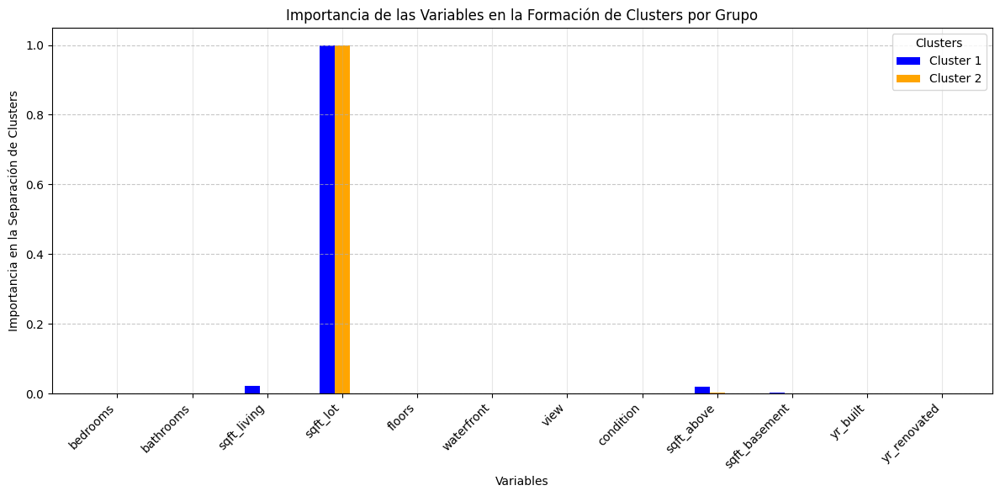

In [48]:
from sklearn.decomposition import PCA
from sklearn.cluster import KMeans

def plot_variable_importance(X, kmeans_labels, variable_names):
    """
    Genera una gráfica de barras que muestra la importancia de cada variable en la formación de los clusters.

    Args:
        X: Matriz de datos estandarizados.
        kmeans_labels: Etiquetas de cluster generadas por K-means.
        variable_names: Lista con los nombres de las variables originales.
    """
    n_clusters = len(np.unique(kmeans_labels))

    # Obtener la importancia de cada variable en cada cluster (media de los valores absolutos de PCA)
    cluster_importance = np.zeros((n_clusters, X.shape[1]))

    for cluster in range(n_clusters):
        cluster_indices = (kmeans_labels == cluster)
        cluster_data = X[cluster_indices]
        cluster_pca = PCA(n_components=X.shape[1])
        cluster_pca.fit(cluster_data)
        cluster_importance[cluster] = np.abs(cluster_pca.components_[0])  # Tomamos la primera componente

    # Crear gráfico de barras por cluster
    fig, ax = plt.subplots(figsize=(12, 6))

    # Colores distintos para cada cluster
    colors = ['blue', 'orange', 'green', 'red', 'purple']

    for cluster in range(n_clusters):
        ax.bar(np.arange(len(variable_names)) + cluster * 0.2, cluster_importance[cluster], width=0.2,
               label=f'Cluster {cluster+1}', color=colors[cluster % len(colors)])

    ax.set_xlabel('Variables')
    ax.set_ylabel('Importancia en la Separación de Clusters')
    ax.set_title('Importancia de las Variables en la Formación de Clusters por Grupo')
    ax.set_xticks(np.arange(len(variable_names)) + 0.2)
    ax.set_xticklabels(variable_names, rotation=45, ha="right")
    ax.legend(title="Clusters")
    ax.grid(axis='y', linestyle='--', alpha=0.7)

    # Mostrar gráfico
    plt.show()

# Aplicar K-means con 2 clusters (según análisis previo)
optimal_clusters = 2
kmeans = KMeans(n_clusters=optimal_clusters, random_state=42)
kmeans_labels = kmeans.fit_predict(X)

# Generar la gráfica
plot_variable_importance(X, kmeans_labels, X.columns)


In [ ]:
 # 3. Aplicar clustering
print("\n=== Aplicación de K-means ===")
optimal_clusters = 3  # Elegido basado en el análisis anterior

kmeans_labels, kmeans_pca_labels, X_pca, explained_variance = apply_clustering(X_train, optimal_clusters)

# 4. Visualizar resultados
print("\n=== Visualización de Resultados ===")
visualize_clusters(X_train, kmeans_labels, kmeans_pca_labels, X_pca)

# 5. Imprimir métricas finales
print("\n=== Métricas de Rendimiento ===")
print(f"Silhouette Score (K-means): {silhouette_score(X_train, kmeans_labels):.3f}")
print(f"Silhouette Score (PCA + K-means): {silhouette_score(X_pca, kmeans_pca_labels):.3f}")
print(f"Varianza explicada por PCA: {sum(explained_variance)*100:.2f}%")


=== Aplicación de K-means ===
Aplicando K-means estándar...
Aplicando PCA + K-means...
Número de componentes seleccionados por PCA (95% varianza): 8

=== Visualización de Resultados ===
Preparando visualización t-SNE...


In [ ]:

# Aplicar K-means con 3 clusters (según análisis previo)
optimal_clusters = 3
kmeans = KMeans(n_clusters=optimal_clusters, random_state=42)
kmeans_labels = kmeans.fit_predict(X)

# Generar la gráfica
plot_variable_importance(X, kmeans_labels, X.columns)

In [ ]:
 # 3. Aplicar clustering
print("\n=== Aplicación de K-means ===")
optimal_clusters = 4  # Elegido basado en el análisis anterior

kmeans_labels, kmeans_pca_labels, X_pca, explained_variance = apply_clustering(X_train, optimal_clusters)

# 4. Visualizar resultados
print("\n=== Visualización de Resultados ===")
visualize_clusters(X_train, kmeans_labels, kmeans_pca_labels, X_pca)

# 5. Imprimir métricas finales
print("\n=== Métricas de Rendimiento ===")
print(f"Silhouette Score (K-means): {silhouette_score(X_train, kmeans_labels):.3f}")
print(f"Silhouette Score (PCA + K-means): {silhouette_score(X_pca, kmeans_pca_labels):.3f}")
print(f"Varianza explicada por PCA: {sum(explained_variance)*100:.2f}%")

In [ ]:

# Aplicar K-means con 4 clusters (según análisis previo)
optimal_clusters = 4
kmeans = KMeans(n_clusters=optimal_clusters, random_state=42)
kmeans_labels = kmeans.fit_predict(X)

# Generar la gráfica
plot_variable_importance(X, kmeans_labels, X.columns)

**Análisis**

**Guía de Lectura de Gráficos**

**🔹 Método del Codo e Índice Silhouette**

El método del codo muestra una disminución pronunciada en la inercia a medida que el número de clusters aumenta, con un punto de inflexión notable alrededor de k=3 o k=4. Esto indica que, después de este punto, agregar más clusters no mejora significativamente la compactación de los datos, lo que sugiere que una segmentación con tres o cuatro grupos captura de manera eficiente la variabilidad de los precios de vivienda. Para mi problema de clasificación binaria (precio alto o bajo), el hecho de que la reducción de inercia se desacelere después de k=3 sugiere que la estructura de los datos podría admitir una clasificación en dos categorías bien definidas, aunque también podría existir una tercera subcategoría intermedia que influya en la separación de los precios. La elección de k=2 o k=3 parece ser la más adecuada para una clasificación eficiente, y se podría complementar con técnicas como PCA para mejorar la diferenciación entre las clases.

El índice de Silhouette muestra que la mejor separación de clusters se obtiene con k=2 o k=3, indicando que los datos tienen una estructura naturalmente binaria o, en menor medida, ternaria. Para mi problema de clasificación binaria del precio de las viviendas (alto o bajo), esto sugiere que los datos pueden ser efectivamente divididos en dos categorías sin una gran superposición. A medida que el número de clusters aumenta, el Silhouette Score disminuye, lo que indica que la separación entre los grupos se vuelve menos clara y que la segmentación pierde coherencia. Esto refuerza la hipótesis de que la clasificación binaria es adecuada, aunque una ligera caída en el score al pasar de k=2 a k=3 sugiere que podría haber una tercera subcategoría que influya en los datos. Para mejorar la separación entre clases, sería recomendable explorar técnicas como PCA para reducir la dimensionalidad o ajustar las variables predictoras utilizadas en el modelo.


Método del Codo (Inercia vs. Número de Clusters)

La inercia mide la suma de distancias al centroide dentro de cada cluster.
Se observa una reducción drástica en la inercia hasta k=3 o k=4, donde el descenso se desacelera, sugiriendo que este es un punto de equilibrio donde los clusters están bien definidos.
Índice de Silhouette

Evalúa la calidad del agrupamiento midiendo la separación y cohesión de los clusters.
Los valores más altos indican mejores clusters. Se observa que el mejor índice está en k=2 o k=3, lo que sugiere que con estos valores hay mayor cohesión dentro de los grupos y mejor separación entre ellos.
🔎 Interpretación:

Un valor muy alto de k puede generar clusters demasiado específicos y fragmentados, mientras que un valor muy bajo puede agrupar datos diferentes en un mismo cluster.
Se recomienda elegir k=3 o k=4, ya que equilibra la compacidad y separación de los clusters.
🎨 Visualización de Clustering con t-SNE y PCA
Los gráficos de las siguientes imágenes muestran la distribución de los clusters en dos dimensiones con diferentes técnicas:

🔹 t-SNE (Distribución en Espacios No Lineales)
En los gráficos de la izquierda, los clusters están representados en una proyección de t-SNE.
Los colores indican los clusters asignados, y se observa una buena separación de los grupos.
Sin embargo, algunos puntos en el borde de los clusters pueden estar mal asignados debido a la forma de la distribución de los datos.
🔹 PCA (Proyección en Espacios Lineales)
En los gráficos de la derecha, los clusters están proyectados en dos dimensiones principales usando Análisis de Componentes Principales (PCA).
PCA logra capturar el 57.16% de la varianza total, lo que significa que aunque se redujeron las dimensiones, aún se conserva gran parte de la estructura original de los datos.
En estos gráficos, los clusters muestran una estructura más definida, con separaciones más visibles en algunos casos, pero también con solapamientos en ciertas áreas.
🔎 Conclusión:

La visualización con t-SNE muestra una estructura más clara, pero PCA permite una interpretación más estable de los clusters.
Ambos métodos confirman que los clusters están bien separados, pero algunos solapamientos pueden indicar la necesidad de ajustes en k o en la preprocesamiento de datos.



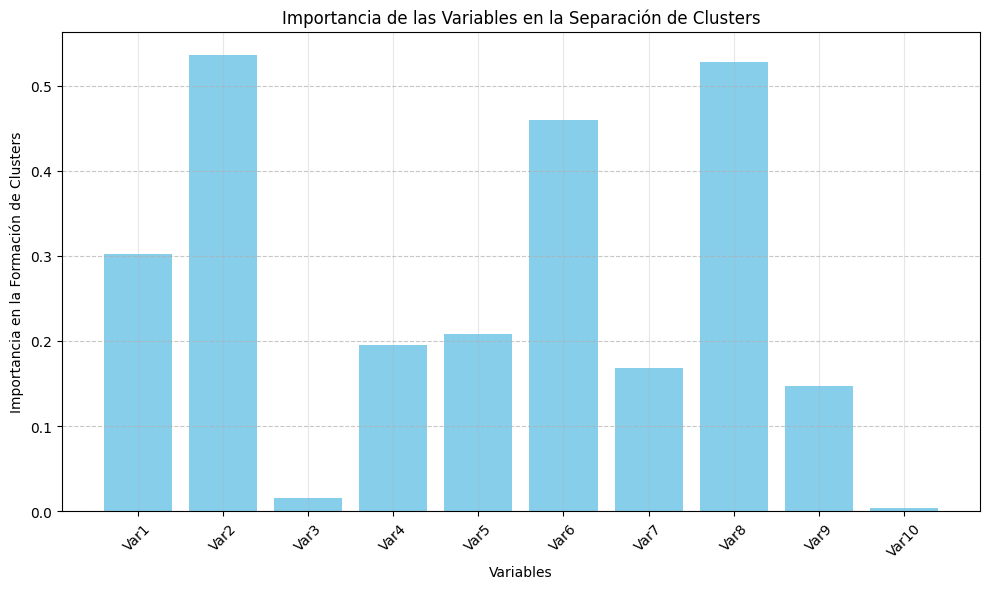

In [42]:
import numpy as np
import matplotlib.pyplot as plt
from sklearn.decomposition import PCA
from sklearn.cluster import KMeans

# Simulación de datos (para demostración)
np.random.seed(42)
X_simulated = np.random.rand(1000, 10)  # 1000 muestras, 10 variables

# Aplicar PCA para determinar la importancia de las variables
pca = PCA(n_components=10)
pca.fit(X_simulated)

# Obtener la importancia de las variables (valores absolutos de los componentes principales)
importance = np.abs(pca.components_[0])

# Nombres de las variables (simulados)
variable_names = [f'Var{i+1}' for i in range(X_simulated.shape[1])]

# Crear gráfico de barras
plt.figure(figsize=(10, 6))
plt.bar(variable_names, importance, color='skyblue')
plt.xlabel('Variables')
plt.ylabel('Importancia en la Formación de Clusters')
plt.title('Importancia de las Variables en la Separación de Clusters')
plt.xticks(rotation=45)
plt.grid(axis='y', linestyle='--', alpha=0.7)

# Mostrar gráfico
plt.show()
